In [2]:
import uproot3 as up
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from scipy.stats import rayleigh

dt_ratios = ["0.33", "0.6", "2.0"]
chi_types = ["scalar", "fermion"]


In [3]:
def circular_variance(angles):
    normalized_angles = angles / np.pi
    _,result = rayleigh.test(normalized_angles)
    return result

def circ_check(counts):
    #get highest value
    max_count = np.max(counts)
    count_diff = max_count - counts
    ratio = np.sum(count_diff) / np.sum(counts)
    return ratio
def get_name_info (file_name):
    # Split the file name
    split_file_name = file_name.split("_")

    origin_type = split_file_name[0]
    dm_type = split_file_name[1]
    mass = split_file_name[3]
    mass = float(mass)
    dt_ratio = split_file_name[5].strip(".root")
    dt_ratio = float(dt_ratio)
    return origin_type, dm_type, mass, dt_ratio
     

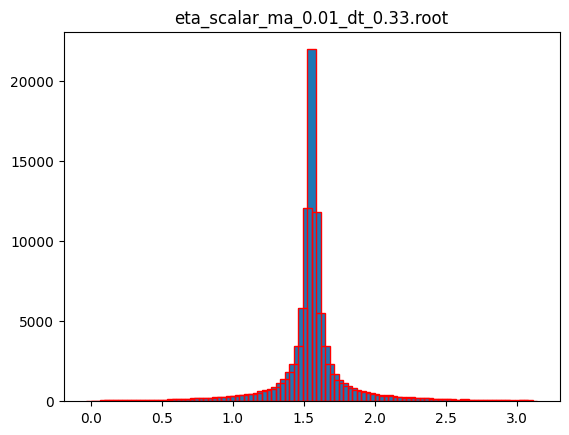

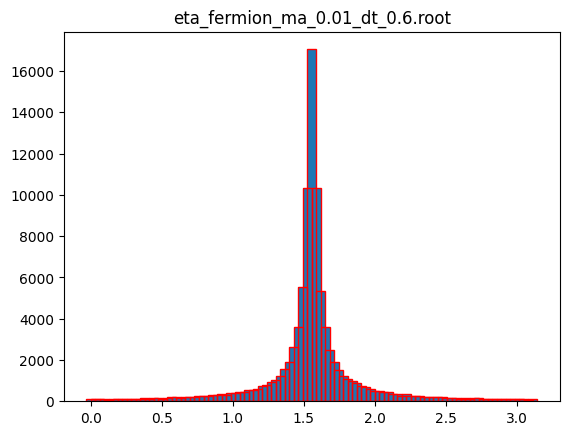

In [7]:
circular_variance = []
for chi_t in chi_types:
    path = f"../data/root_files/angular/{chi_t}/"
    #path = f"../data/root_files/{chi_t}_tmp/"
    
    files = os.listdir(path)
    
    files.sort()
    for file in files:
        with up.open(path+file) as f:
            if f.keys() == []:
                continue

            bins = np.linspace(0.0,  np.pi, 100) # 24 bins over 2 pi angles

            # do xy first
            # theta_xy = arctan(py/px)
            # theta_xy_microboone = 
            theta_xy = np.arctan2(f[b'event_tree'][b'dm_pz'].array(), f[b'event_tree'][b'dm_px'].array())
            theta_xy = np.mod(theta_xy + 2 * np.pi, 2 * np.pi)
            counts_xy, _ = np.histogram(theta_xy, bins=bins)
            


            # https://math.stackexchange.com/questions/1327253/how-do-we-find-out-angle-from-x-y-coordinates
            x = f[b'event_tree'][b'dm_px'].array()
            y = f[b'event_tree'][b'dm_pz'].array()
            theta_xy_2 = np.pi - ((np.pi/2.) * (1 + np.sign(x))*(1 - np.sign(y**2))) - ((np.pi / 4.) * (2 + np.sign(x))*np.sign(y)) - np.sign(x*y)*np.arctan((np.abs(x) - np.abs(y)) / (np.abs(x) + np.abs(y)))

            counts_xy_2, _ = np.histogram(theta_xy_2, bins=bins)
            


            
            theta_xy_variance = circ_check(counts_xy)
            theta_xy_2_variance = circ_check(counts_xy_2)
            
            origin_type, dm_type, mass, dt_ratio = get_name_info(file)
            circular_variance.append([origin_type, dm_type, mass, dt_ratio, theta_xy_variance])
            fig = plt.figure()
            width = 2 * np.pi / (len(bins) - 1)
            ax = fig.add_subplot(1, 1, 1)
            bars = ax.bar(bins[:-1], counts_xy, width=width, bottom=0.0)
            bars2 = ax.bar(bins[:-1], counts_xy_2, width=width, bottom=0.0, fill=False, edgecolor='red')
            ax.set_title(file)
            plt.show()
            #plt.savefig(f"../plots/angular_yz/{chi_t}/{file}.png")
            break
circular_variance = pd.DataFrame(circular_variance, columns=["origin_type", "dm_type", "mass", "dt_ratio",
                                                             "circular_variance"])


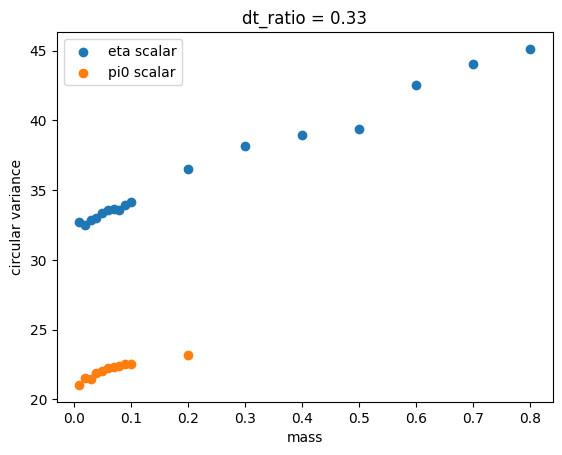

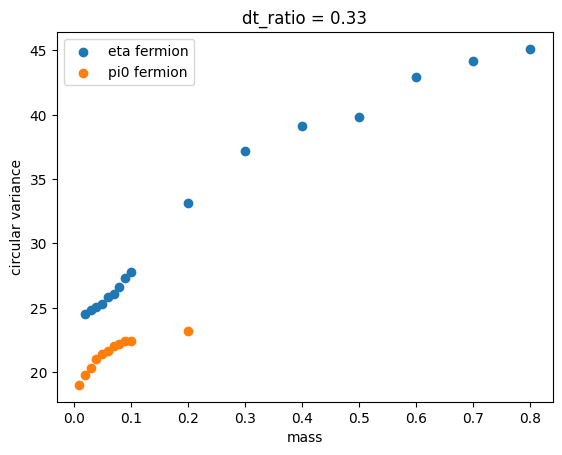

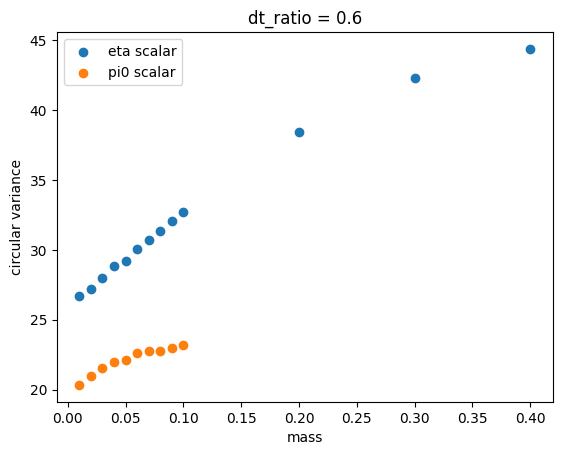

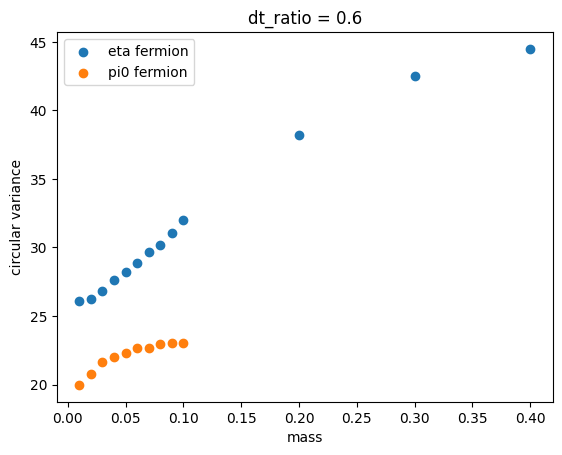

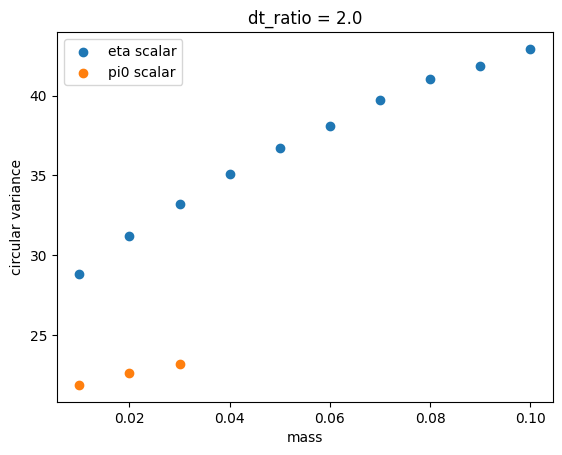

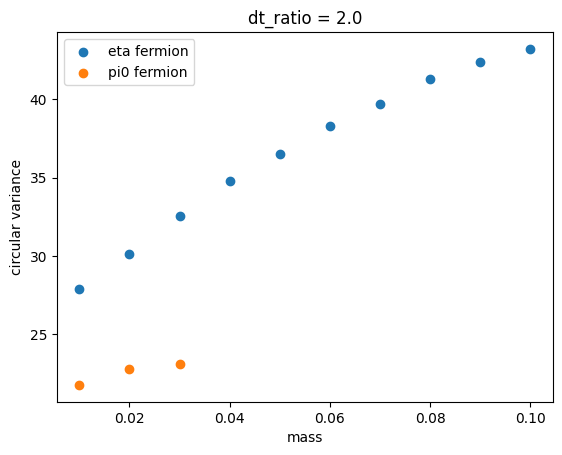

In [27]:
for dt_ratio in dt_ratios:
    for dm_type in circular_variance["dm_type"].unique():
        fig, ax = plt.subplots()
        for origin_type in circular_variance["origin_type"].unique():
                
                    #plot the data
            data = circular_variance[(circular_variance["origin_type"] == origin_type) & (circular_variance["dm_type"] == dm_type) & (circular_variance["dt_ratio"] == float(dt_ratio))]
            plt.scatter(data["mass"], data["circular_variance"], label=f"{origin_type} {dm_type}")
        plt.xlabel("mass")
        plt.ylabel("circular variance")
        plt.title(f"dt_ratio = {dt_ratio}")
        plt.legend()
        
        plt.savefig(f"../plots/angular_xz/mass_point_plots/{dm_type}_{dt_ratio}.png")

In [30]:
for file in os.listdir("../data/angle/scalar"):
    with up.open(f"../data/angle/scalar/{file}") as f:
        print(f[b'pot_tree'][b'ntrials'].array())

[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]
[50001.]


10000 10000
(10000,)
10000 10000


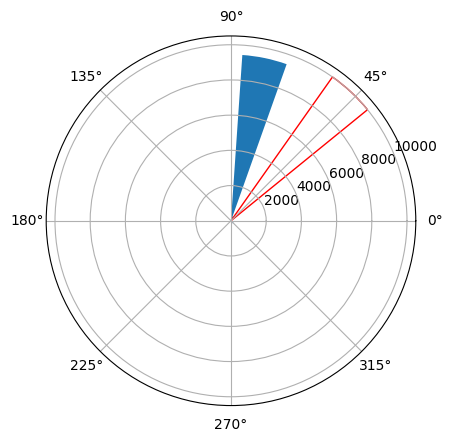

10000 10000
(10000,)
10000 10000


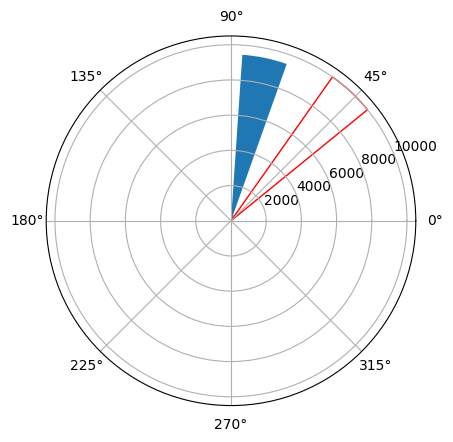

10020 10020
(10020,)
10020 10020


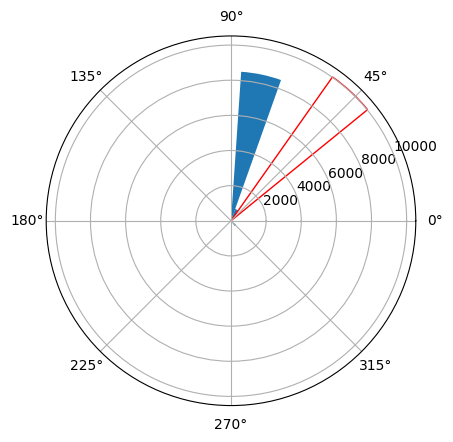

10016 10016
(10016,)
10016 10016


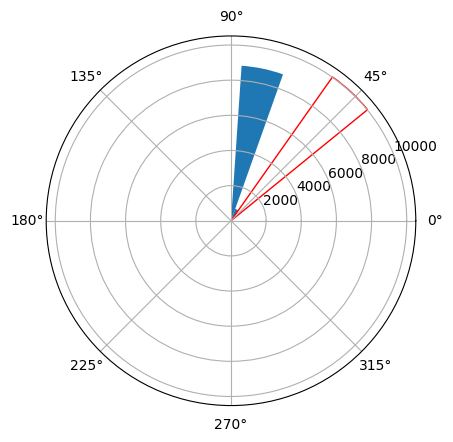

10000 10000
(10000,)
10000 10000


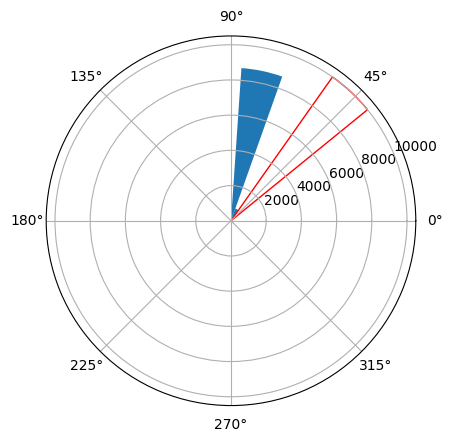

10008 10008
(10008,)
10008 10008


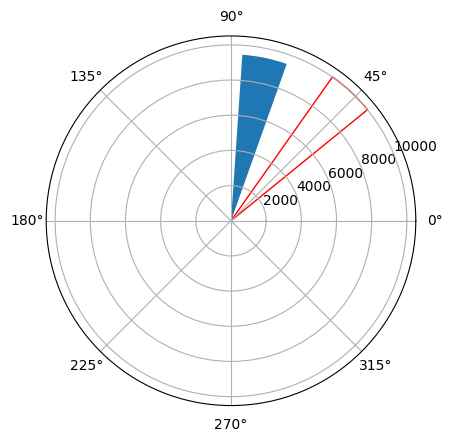

10045 10045
(10045,)
10045 10045


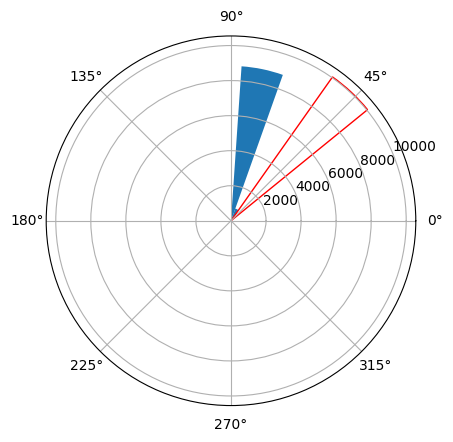

10001 10001
(10001,)
10001 10001


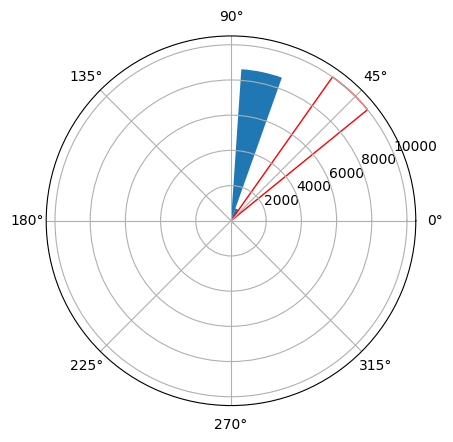

10002 10002
(10002,)
10002 10002


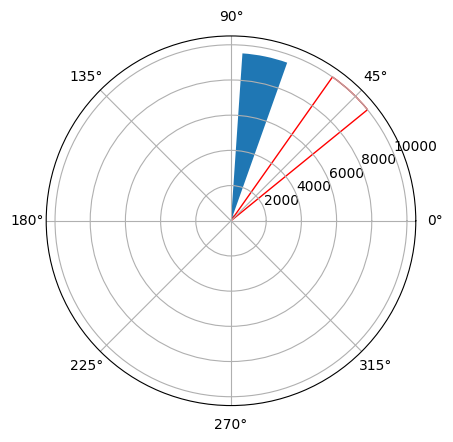

10000 10000
(10000,)
10000 10000


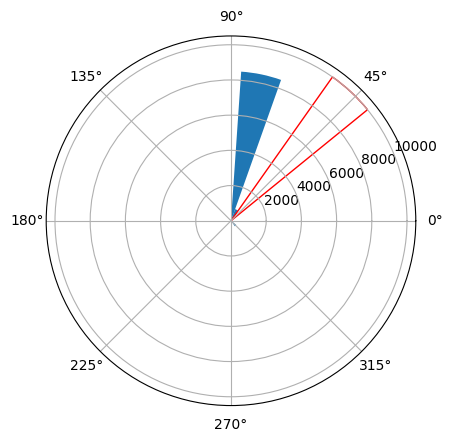

In [3]:
for chi_t in chi_types:
    path = f"../data/root_files/{chi_t}_tmp/"
    for file in os.listdir(path)[0:5]:
        with up.open(path+file) as f:
            if f.keys() == []:
                continue

            bins = np.linspace(0.0, 2 * np.pi, 24) # 24 bins over 2 pi angles

            # do xy first
            # theta_xy = arctan(py/px)
            # theta_xy_microboone = 
            theta_xy = np.arctan2(f[b'event_tree'][b'dm_pz'].array(), f[b'event_tree'][b'dm_px'].array())
            theta_xy = np.mod(theta_xy + 2 * np.pi, 2 * np.pi)
            counts_xy, _ = np.histogram(theta_xy, bins=bins)
            print(len(theta_xy), sum(counts_xy))
            print(f[b'event_tree'][b'dm_px'].array().shape)


            # https://math.stackexchange.com/questions/1327253/how-do-we-find-out-angle-from-x-y-coordinates
            x = f[b'event_tree'][b'dm_px'].array()
            y = f[b'event_tree'][b'dm_py'].array()
            theta_xy_2 = np.pi - ((np.pi/2.) * (1 + np.sign(x))*(1 - np.sign(y**2))) - ((np.pi / 4.) * (2 + np.sign(x))*np.sign(y)) - np.sign(x*y)*np.arctan((np.abs(x) - np.abs(y)) / (np.abs(x) + np.abs(y)))

            counts_xy_2, _ = np.histogram(theta_xy_2, bins=bins)
            print(len(theta_xy_2), sum(counts_xy_2))


            

            fig = plt.figure()
            width = 2 * np.pi / (len(bins) - 1)
            ax = fig.add_subplot(1, 1, 1, polar=True)
            bars = ax.bar(bins[:-1], counts_xy, width=width, bottom=0.0)
            bars2 = ax.bar(bins[:-1], counts_xy_2, width=width, bottom=0.0, fill=False, edgecolor='red')

            plt.show()

/tmp/ipykernel_4348/3379545468.py:63: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


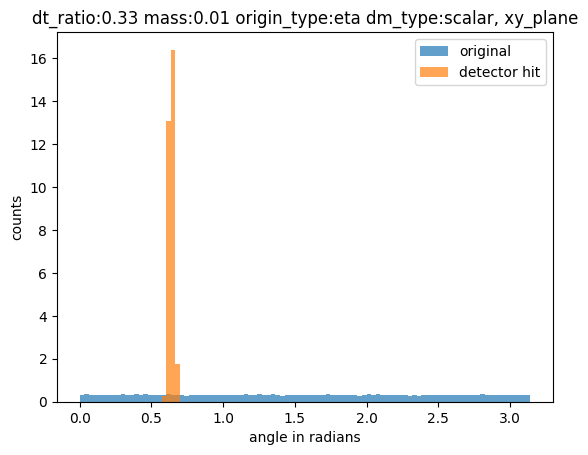

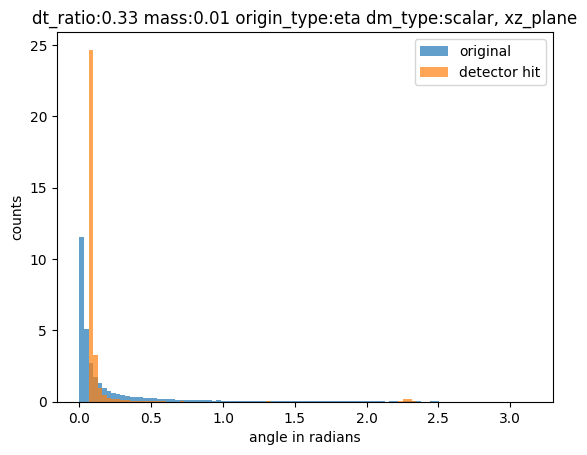

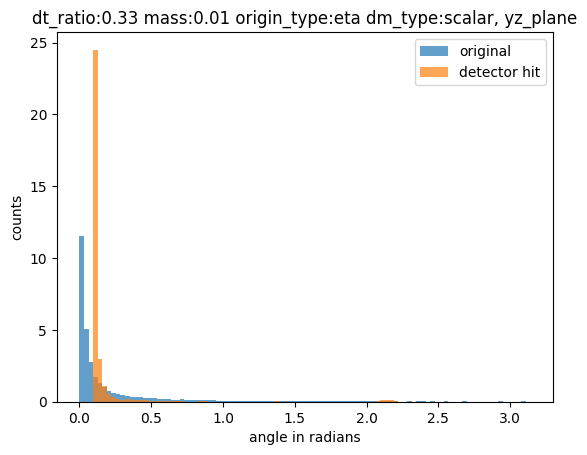

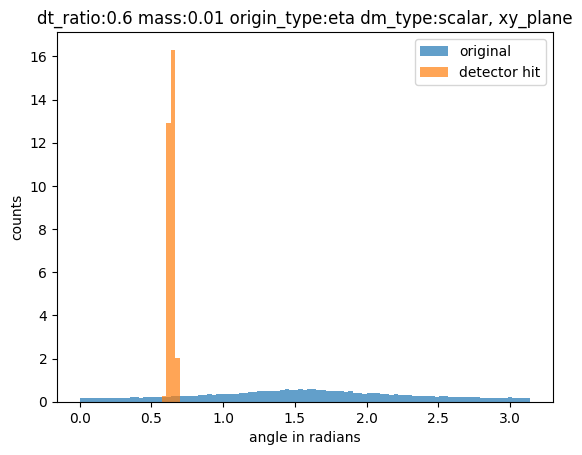

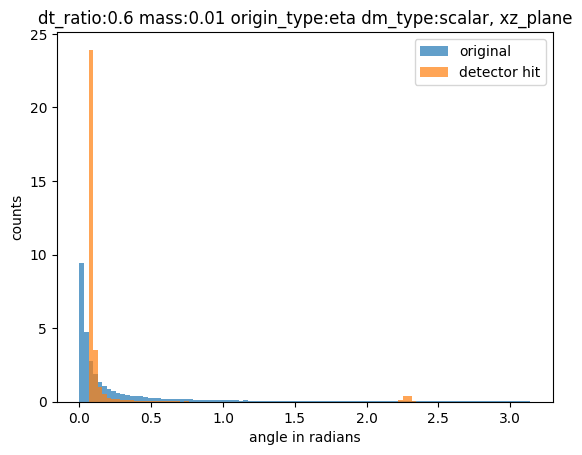

...

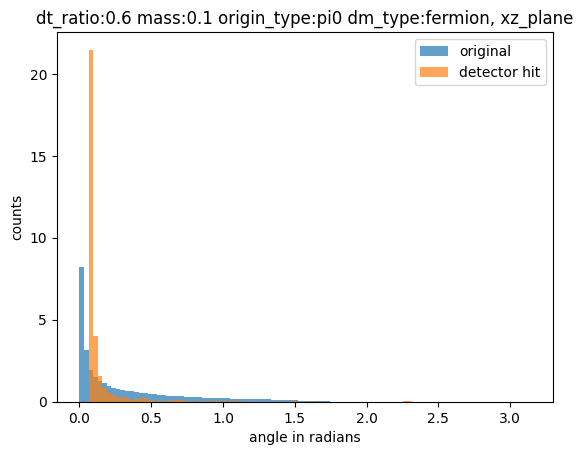

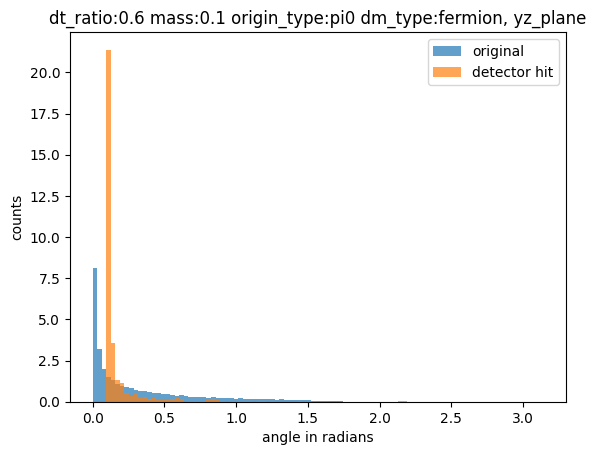

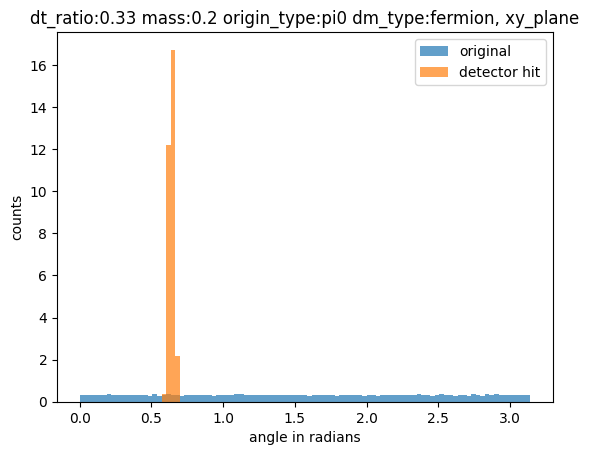

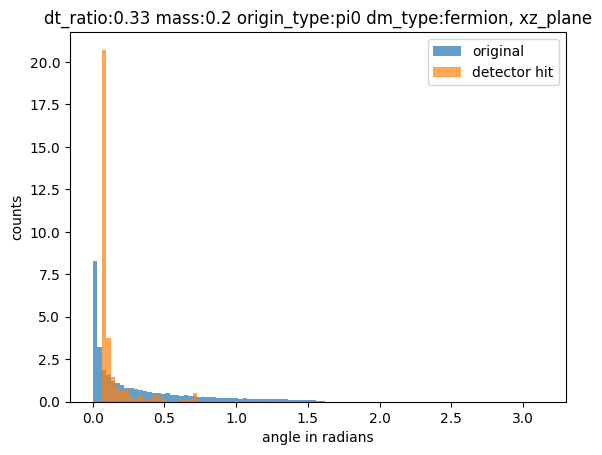

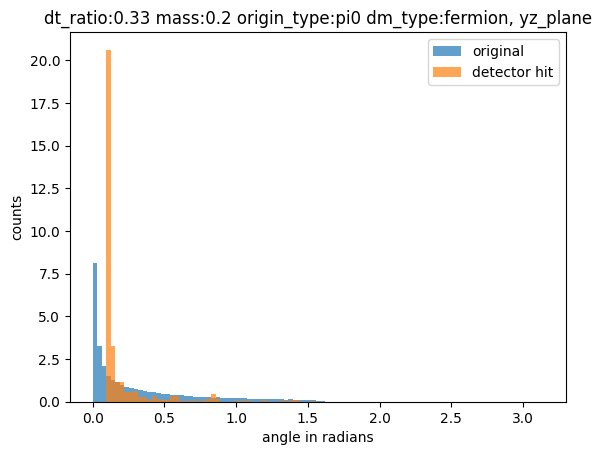

In [41]:
circular_variance = []
for chi_t in chi_types:
    path = f"../data/root_files/angular/{chi_t}/"
    path_dec = f"../data/root_files/{chi_t}_tmp/"
    
    files = os.listdir(path)
    plane1 =["x","x","y"]
    plane2 = ["y","z","z"]
    files.sort()
    for file in files:
        for i in range(3):
            with up.open(path+file) as f:
                if f.keys() == []:
                    continue

                bins = np.linspace(0.0,  np.pi, 100) # 24 bins over 2 pi angles

                # do xy first
                # theta_xy = arctan(py/px)
                # theta_xy_microboone = 
                plane_a = f"dm_p{plane1[i]}"
                plane_b = f"dm_p{plane2[i]}"
                theta_xy = np.arctan2(f[b'event_tree'][plane_a.encode('utf-8')].array(), f[b'event_tree'][plane_b.encode('utf-8')].array())
                theta_xy = np.mod(theta_xy + 2 * np.pi, 2 * np.pi)
                counts_xy, _ = np.histogram(theta_xy, bins=bins)
                


                # https://math.stackexchange.com/questions/1327253/how-do-we-find-out-angle-from-x-y-coordinates
                x = f[b'event_tree'][b'dm_px'].array()
                y = f[b'event_tree'][b'dm_pz'].array()
                theta_xy_2 = np.pi - ((np.pi/2.) * (1 + np.sign(x))*(1 - np.sign(y**2))) - ((np.pi / 4.) * (2 + np.sign(x))*np.sign(y)) - np.sign(x*y)*np.arctan((np.abs(x) - np.abs(y)) / (np.abs(x) + np.abs(y)))

                counts_xy_2, _ = np.histogram(theta_xy_2, bins=bins)
                


                
                theta_xy_variance = circ_check(counts_xy)
                theta_xy_2_variance = circ_check(counts_xy_2)
            with up.open(path_dec+file) as f:
                if f.keys() == []:
                    continue
                # do xy first
                # theta_xy = arctan(py/px)
                # theta_xy_microboone = 
                plane_a = f"dm_p{plane1[i]}"
                plane_b = f"dm_p{plane2[i]}"
                theta_xy_dec = np.arctan2(f[b'event_tree'][plane_a.encode('utf-8')].array(), f[b'event_tree'][plane_b.encode('utf-8')].array())
                theta_xy_dec = np.mod(theta_xy_dec + 2 * np.pi, 2 * np.pi)
                counts_xy_dec, _ = np.histogram(theta_xy_dec, bins=bins)
                


                
                


                
                theta_xy_variance = circ_check(counts_xy)
            origin_type, dm_type, mass, dt_ratio = get_name_info(file)
            circular_variance.append([origin_type, dm_type, mass, dt_ratio, theta_xy_variance])
            fig = plt.figure()
            width = 2 * np.pi / (len(bins) - 1)
            ax = fig.add_subplot(1, 1, 1)
            # Calculate the total area of the histogram
            total_area_xy = np.sum(counts_xy * width)
            total_area_xy_dec = np.sum(counts_xy_dec * width)

            # Normalize the counts
            counts_xy_normalized = counts_xy / total_area_xy
            counts_xy_dec_normalized = counts_xy_dec / total_area_xy_dec
            bars = ax.hist(theta_xy,bins = bins, label = "original",density=True, alpha=0.7)
            bars2 = ax.hist(theta_xy_dec,bins=bins, label = "detector hit",density=True, alpha=0.7)
            ax.set_title(f"dt_ratio:{dt_ratio} mass:{mass} origin_type:{origin_type} dm_type:{dm_type}, {plane1[i]}{plane2[i]}_plane")
            
            plt.xlabel("angle in radians")
            plt.ylabel("counts")
            plt.legend()
            plt.savefig(f"../plots/angular_{plane1[i]}{plane2[i]}/{chi_t}/{file}_compare.png")
            
        


            #plt.savefig(f"../plots/angular_yz/{chi_t}/{file}.png")